/tmp/ipykernel_4860/1754234430.py:62: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


File fisheye_196.jpg.pkl not found.


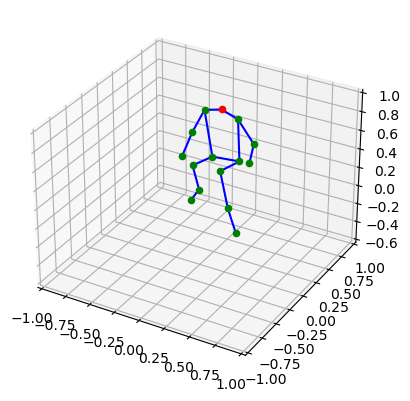

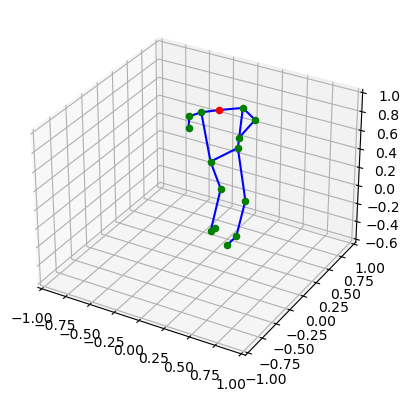

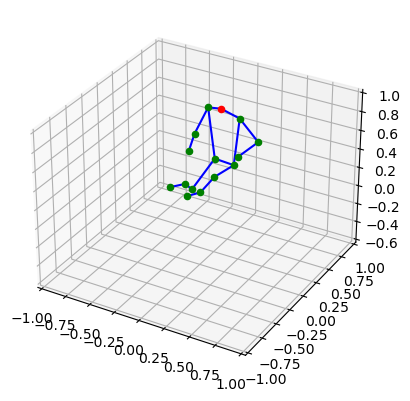

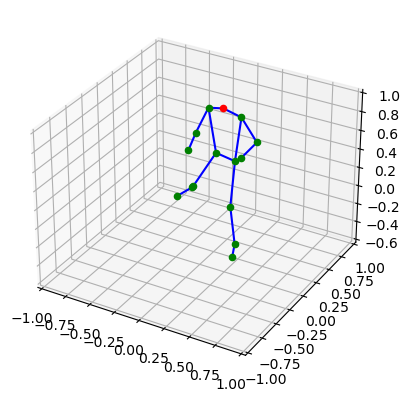

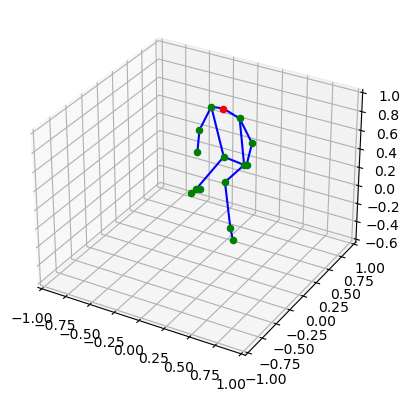

...

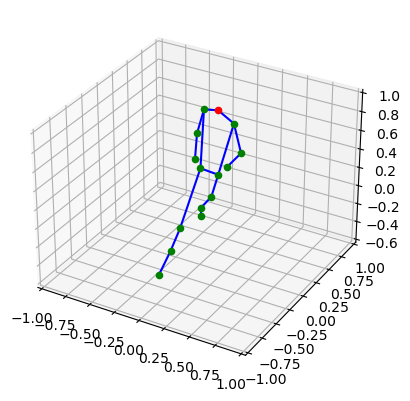

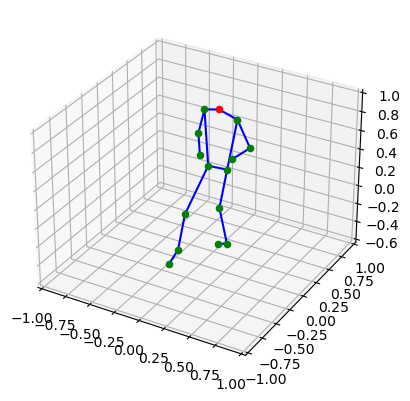

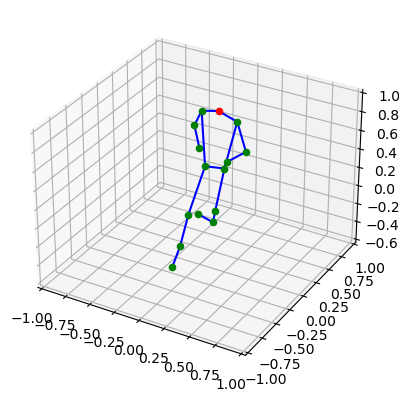

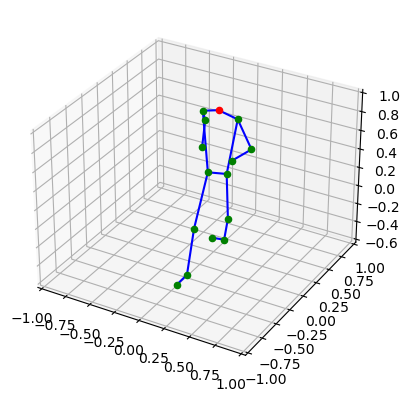

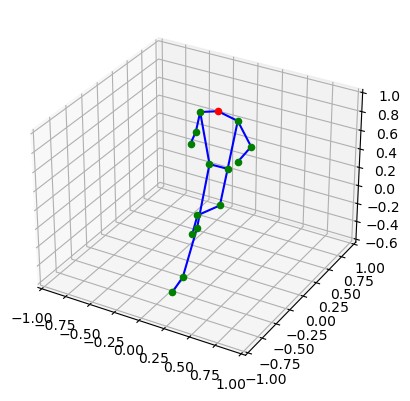

In [42]:
import pickle
import numpy as np
import json, codecs
import numpy as np
# Loop through the range
for o in range(1,1000):
    # Use f-string formatting for the filename
    filename = f'fisheye_{o}.jpg.pkl'
    
    # Open and load the file
    try:
        with open(filename, 'rb') as file:
            loaded_data = pickle.load(file)
        
        # Convert loaded data to numpy array and print it
        loaded_data = np.array(loaded_data)
        # print(loaded_data)

        
        # Convert numpy array to list
        loaded_data = list([x,y,1-z] for x,y,z in loaded_data)
        # list_array
        
        file_path = "output_skeleton.json" 
        # # Serialize to JSON
        # json_array = json.dumps(list_array)
        
        heatmap_sequence = ["Neck", "Right_shoulder", "Right_elbow", "Right_wrist", "Left_shoulder", "Left_elbow",
                                "Left_wrist", "Right_hip", "Right_knee", "Right_ankle", "Right_foot", "Left_hip",
                                "Left_knee", "Left_ankle", "Left_foot"]
        
        sk_dict = dict(zip(heatmap_sequence,loaded_data))
        sk_dict

        lines = [(0, 1), (0, 4), (1, 2), (2, 3), (4, 5), (5, 6), (1, 7), (4, 11), 
         (7, 8), (8, 9), (9, 10), (11, 12), (12, 13), (13, 14), (7, 11)]
        heatmap_sequence = ["Neck", "Right_shoulder", "Right_elbow", "Right_wrist", "Left_shoulder", "Left_elbow",
                                "Left_wrist", "Right_hip", "Right_knee", "Right_ankle", "Right_foot", "Left_hip",
                                "Left_knee", "Left_ankle", "Left_foot"]
        
        dict_lines={}
        for i,j in lines:
            x1, y1, z1 = loaded_data[i]
            x2, y2, z2 = loaded_data[j]
            dict_lines['%s to %s'%(heatmap_sequence[i], heatmap_sequence[j])] = {'start_point' : [x1, y1, z1], 'end_point' :[x2, y2, z2]}
        dict_lines

        il = [1,2,3]
        list(map(float, il))

        # dict_lines = {k: {[float(num) for num in v_point] for k_point, v_point in v.items()} for k, v in dict_lines.items()}
        dict_lines = {key_line:{k: list(map(float,v)) for k,v in v_line.items()} for key_line, v_line in dict_lines.items()}
        # dict_lines
        file_path = "./output_skeleton_lines.json" 
        json.dump(dict_lines, codecs.open(file_path, 'w', encoding='utf-8'), separators=(',', ':'), sort_keys=True, indent=4) ### this saves the array in .json format
                 

        # %matplotlib widget
        from mpl_toolkits.mplot3d import axes3d
        import matplotlib.pyplot as plt
        
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        i=0
        n=0
        
        for x,y,z in loaded_data:
            if i == n:
                ax.scatter3D(x,y,z, color='r' )# 3D scatter plot)
            else:
                ax.scatter3D(x,y,z,color='g')
            i +=1
        
        lines = [(0, 1), (0, 4), (1, 2), (2, 3), (4, 5), (5, 6), (1, 7), (4, 11), 
                 (7, 8), (8, 9), (9, 10), (11, 12), (12, 13), (13, 14), (7, 11)]
        for i,j in lines:
            x1, y1, z1 = loaded_data[i]
            x2, y2, z2 = loaded_data[j]
            ax.plot([x1, x2], [y1, y2], [z1, z2], 'b-')  # 'b-'는 파란색 실선을 의미합니다.
        
        ax.set_xlim(-1,1)
        ax.set_ylim(-1,1)
        ax.set_zlim(-0.6,1)
        # ax.axis('off')
        # Z 축의 방향을 바꿉니다.
        # ax.invert_zaxis()
        fig.savefig(f"{o}.png")
        # fig2,ax2 = plt.subplots()
        # plt.imshow(img)
    except FileNotFoundError:
        print(f"File {filename} not found.")
        break


In [43]:
import cv2
import os

img_folder_path = './'  # 이미지 폴더 경로
images = [img for img in os.listdir(img_folder_path) if img.endswith(".png")]
images.sort()  # 파일 이름 순서대로 정렬

frame = cv2.imread(os.path.join(img_folder_path, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter('video.mp4', cv2.VideoWriter_fourcc(*'DIVX'), 12.5, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(img_folder_path, image)))

cv2.destroyAllWindows()
video.release()

OpenCV: FFMPEG: tag 0x58564944/'DIVX' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
